<a href="https://colab.research.google.com/github/ShiningYang0207/ECE661_final_project/blob/main/image_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## insert drive path in the current content
!ln -s '/content/drive/MyDrive/ECE 661/ECE 661 final project/robustness_applications/' /content/robustness_applications

In [ ]:
!pip install -r  /content/robustness_applications/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 125 kB 14.8 MB/s 
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7409 sha256=553df9ede64c00d92d4cd103ea76386a3bba3524bf4da420f45531fdbcf9afa9
  Stored in directory: /root/.cache/pip/wheels/ba/03/bb/7a97840eb54479b328672e15a536e49dc60da200fb21564d53
Successfully built GPUtil


In [ ]:

!pip install cox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 55 kB 4.0 MB/s 
     |████████████████████████████████| 182 kB 28.4 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 


In [ ]:
import sys
sys.path.insert(0, "/content/robustness_applications/")

In [ ]:
import os
os.environ['NOTEBOOK_MODE'] = '1'
import sys
import torch as ch
from torch.distributions.multivariate_normal import MultivariateNormal
import numpy as np
import seaborn as sns
from scipy import stats
from tqdm import tqdm, tqdm_notebook
import matplotlib.pyplot as plt
from robustness import model_utils, datasets
from robustness.tools.vis_tools import show_image_row, show_image_column
from robustness.tools.label_maps import CLASS_DICT
from user_constants import DATA_PATH_DICT
import attacks_hw5
#from fastai.vision.all import *

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [ ]:
# more libraries
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
import tensorflow as tf

In [ ]:
device = "cuda" if ch.cuda.is_available() else "cpu"
print("device:", device)

device: cuda


In [ ]:
# loading test(val) data

transform = transforms.Compose([
    # you can add other transformations in this list
    transforms.Resize((224,224)),
    transforms.ToTensor()
])
val_dataset = ImageFolder(root="/content/robustness_applications/dataset/val", transform=transform)

In [ ]:
val_dataset

Dataset ImageFolder
    Number of datapoints: 4485
    Root location: /content/robustness_applications/dataset/val
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
           )

In [ ]:
# Constants
DATA = 'ImageNet' # Choices: ['CIFAR', 'ImageNet', 'RestrictedImageNet', 'ImageNette']
BATCH_SIZE = 5
NUM_WORKERS = 8
NUM_CLASSES_VIS = 10

DATA_SHAPE = 32 if DATA == 'CIFAR' else 224 # Image size (fixed for dataset)
REPRESENTATION_SIZE = 2048 # Size of representation vector (fixed for model)
CLASSES = CLASS_DICT[DATA] # Class names for dataset
NUM_CLASSES = len(CLASSES) - 1 
NUM_CLASSES_VIS = min(NUM_CLASSES_VIS, NUM_CLASSES)
GRAIN = 4 if DATA != 'CIFAR' else 1

In [ ]:
NUM_CLASSES

1000

In [ ]:
#imagenet = datasets.ImageNet("/content/drive/MyDrive/ECE 661/ECE 661 final project/robustness_applications/dataset/val")

In [ ]:
# making test loader

test_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, 
            shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
data_iterator = enumerate(test_loader)

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# _, test_loader = val_dataset.make_loaders(workers=NUM_WORKERS, 
#                                       batch_size=BATCH_SIZE, 
#                                       data_aug=False)
# data_iterator = enumerate(test_loader)

In [ ]:
## load the model - modified

# initialize ResNet50
model = torchvision.models.resnet50()
#model.state_dict().keys()

In [ ]:
# load the pretrained model
#model = ch.nn.DataParallel(model)
checkpoint = ch.load("/content/robustness_applications/models/ImageNet.pt")
#checkpoint['model'].keys()
#checkpoint['state_dict']
#model.load_state_dict(checkpoint['state_dict']) 

In [ ]:
# checkpoint['model'].items()

In [ ]:

#model.state_dict().keys()

In [ ]:
# modify name of parameters to make them compatible with those in resnet50
for key in list(checkpoint['model'].keys()):
    checkpoint['model'][key.replace('module.model.', '').replace('module.attacker.model.', '')] = checkpoint['model'].pop(key)

# filter out normalizer that's not included in resnet50
pretrained_dict = {k: v for k, v in checkpoint['model'].items() if k in model.state_dict()}

In [ ]:
# import re
# modelWeights = {}
# for k,v in checkpoint['model'].items():
#   if re.match("module\.model[a-z0-9.]*", k):
#     newKey = k.split("module.model.")[1]
#     modelWeights[newKey] = v

In [ ]:
# print(set(modelWeights.keys()).difference(set(model.state_dict().keys())))

In [ ]:
# assert if the two state_dict are the same now
print(set(pretrained_dict).difference(set(model.state_dict().keys())))

set()


In [ ]:
model.load_state_dict(pretrained_dict)


<All keys matched successfully>

In [ ]:
# # Load model
# model_kwargs = {
#     'arch': 'resnet50',
#     'dataset': val_dataset,
#     'resume_path': '/content/robustness_applications/models/ImageNet.pt'
# }

# model, _ = model_utils.make_and_restore_model(**model_kwargs)
# model = model.to(device)

In [ ]:
model = model.to(device)

model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
def downsample(x, step=GRAIN):
    down = ch.zeros([len(x), 3, DATA_SHAPE//step, DATA_SHAPE//step])

    for i in range(0, DATA_SHAPE, step):
        for j in range(0, DATA_SHAPE, step):
            v = x[:, :, i:i+step, j:j+step].mean(dim=2, keepdim=True).mean(dim=3, keepdim=True)
            ii, jj = i // step, j // step
            down[:, :, ii:ii+1, jj:jj+1] = v
    return down

def upsample(x, step=GRAIN):
    up = ch.zeros([len(x), 3, DATA_SHAPE, DATA_SHAPE])

    for i in range(0, DATA_SHAPE, step):
        for j in range(0, DATA_SHAPE, step):
            ii, jj = i // step, j // step
            up[:, :, i:i+step, j:j+step] = x[:, :, ii:ii+1, jj:jj+1]
    return up

In [ ]:
# Get seed distribution (can be memory intensive to do all ImageNet classes at once)

im_test, targ_test = [], []
for _, (im, targ) in enumerate(test_loader):
    im_test.append(im)
    targ_test.append(targ)
im_test, targ_test = ch.cat(im_test), ch.cat(targ_test)

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
y, idx, count = tf.unique_with_counts(targ_test)
y

<tf.Tensor: shape=(10,), dtype=int64, numpy=array([4, 0, 6, 1, 5, 8, 9, 7, 2, 3])>

In [ ]:
## Remap Labels
label_mapping = {
    -1 : -1,
    0 : 0,
    1 : 217,
    2 : 482,
    3 : 491,
    4 : 497,
    5 : 566,
    6 : 569,
    7 : 571,
    8 : 574,
    9 : 701,

}
targ_test = targ_test.numpy()
for i in range(0, len(targ_test)):
  targ_test[i] = label_mapping[targ_test[i]]
targ_test = ch.tensor(targ_test)

In [ ]:
targ_test

tensor([497,   0, 569,  ..., 497, 701, 497])

In [ ]:
# normalize data in model
from robustness.tools.helpers import InputNormalize
import scipy

class ModelWithNormalizer(ch.nn.Module):
    def __init__(self, m, n):
      super(ModelWithNormalizer, self).__init__()
      self.model= m
      self.normalizer = n
    
    def forward(self, x):
      return self.model(self.normalizer(x).float())
      
mean = ch.tensor(scipy.ndimage.mean(im_test.numpy())).double()
std = ch.tensor(scipy.ndimage.standard_deviation(im_test.numpy())).double()
normalizedModel = ModelWithNormalizer(model, InputNormalize(mean,std))
normalizedModel = normalizedModel.to(device)

In [ ]:
conditionals = []
for i in tqdm(range(NUM_CLASSES_VIS)):
    imc = im_test[targ_test == label_mapping[i]]
    down_flat = downsample(imc).view(len(imc), -1)
    mean = down_flat.mean(dim=0)
    down_flat = down_flat - mean.unsqueeze(dim=0)
    cov = down_flat.t() @ down_flat / len(imc)
    dist = MultivariateNormal(mean, covariance_matrix=cov+1e-4*ch.eye(3 * DATA_SHAPE//GRAIN * DATA_SHAPE//GRAIN))
    conditionals.append(dist)

100%|██████████| 10/10 [01:12<00:00,  7.28s/it]


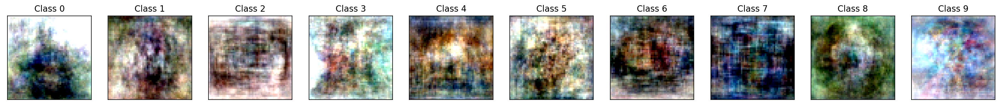

In [ ]:
# Visualize seeds
img_seed = ch.stack([conditionals[i].sample().view(3, DATA_SHAPE//GRAIN, DATA_SHAPE//GRAIN) 
                     for i in range(NUM_CLASSES_VIS)])
img_seed = ch.clamp(img_seed, min=0, max=1)
show_image_row([img_seed.cpu()], tlist=[[f'Class {i}' for i in range(NUM_CLASSES_VIS)]], filename=f"/content/robustness_applications/img_generation_pics_forreport/seed.png")

In [ ]:
# def generation_loss(mod, inp, targ):
#     op = mod(inp)
#     loss = ch.nn.CrossEntropyLoss(reduction='none')(op, targ)
#     return loss, None

# kwargs = {
#         'custom_loss': generation_loss,
#         'constraint':'2',
#         'eps': 40,
#         'step_size': 1,
#         'iterations': 60,
#         'targeted': True, # if true, minimize loss
# }  
    

In [ ]:
# loss.dim()

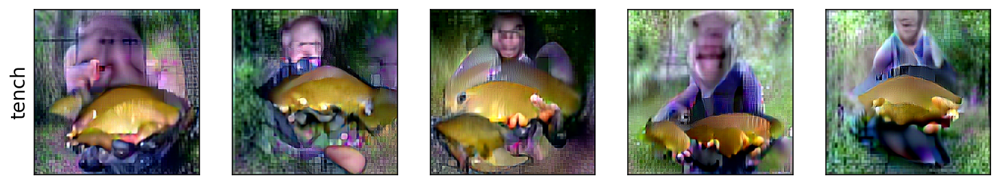

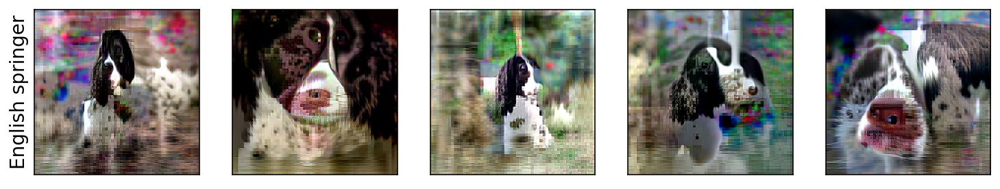

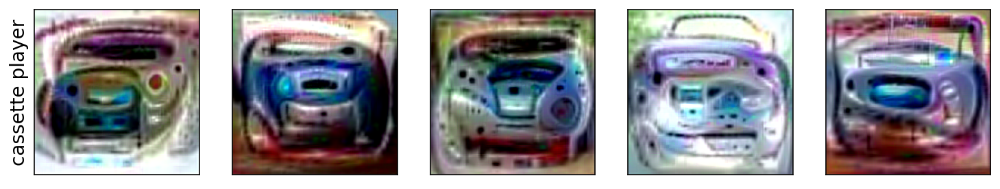

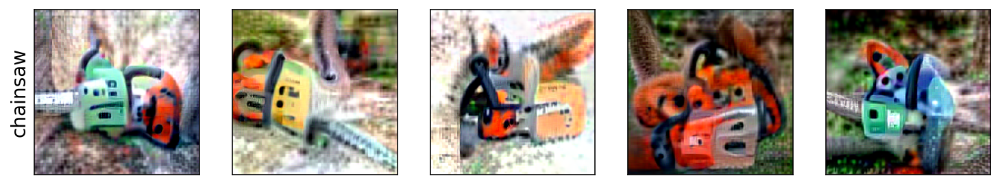

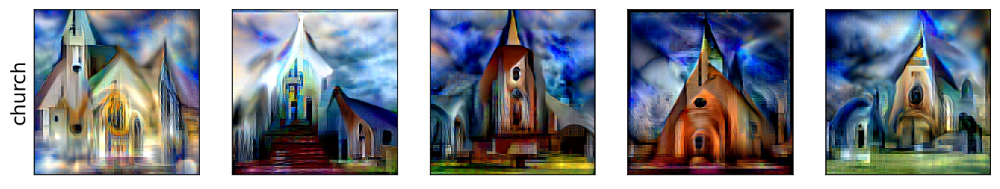

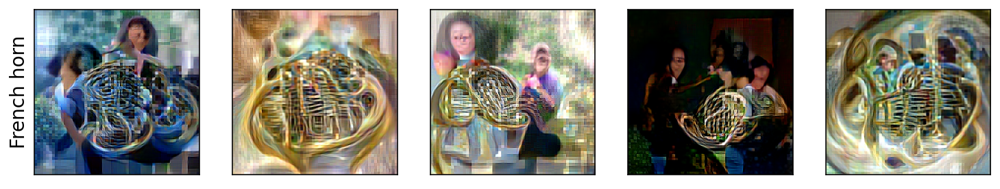

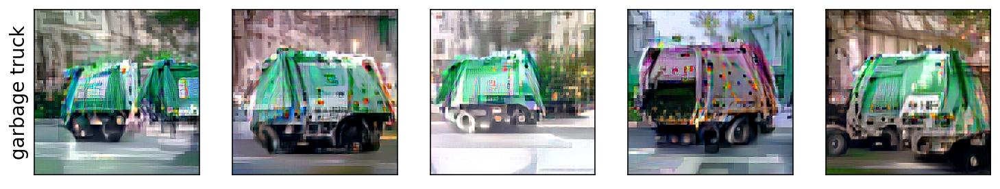

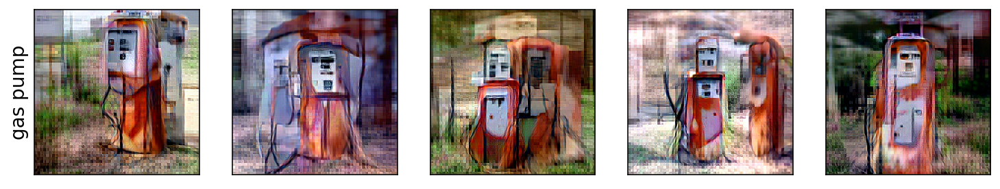

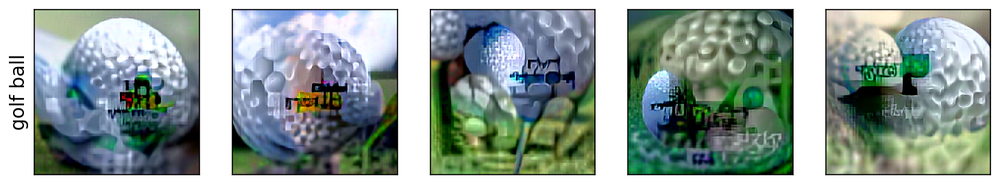

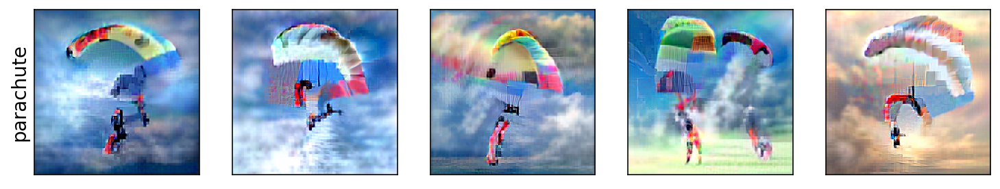

In [ ]:
#model.to(device)
show_seed = False
im_gen_lst = []
class_name_lst = []
for i in range(NUM_CLASSES_VIS):
    target_class = label_mapping[i] * ch.ones((BATCH_SIZE, )).to(device) 
    class_name_lst.append(CLASSES[int(target_class[0])].split(',')[0])
    class_order = i * ch.ones((BATCH_SIZE, )).to(device)
    im_seed = ch.stack([conditionals[int(t)].sample().view(3, DATA_SHAPE//GRAIN, DATA_SHAPE//GRAIN) for t in class_order]).to(device)
    # im_seed = ch.stack([conditionals[int(t)].sample().view(3, DATA_SHAPE//GRAIN, DATA_SHAPE//GRAIN) 
    #                     for t in target_class]).to(device)
    
    im_seed = upsample(ch.clamp(im_seed, min=0, max=1)).to(device)
    im_gen = attacks_hw5.FGM_L2_attack(normalizedModel, device, im_seed, target_class.long(), alpha=1, iters=60)
    im_gen_lst.append(im_gen)
    #t = t+1
    if show_seed:
        show_image_row([im_seed.cpu()], [f'Seed ($x_0$)'], fontsize=18)

# im_gen_lst = ch.cat(im_gen_lst)
    show_image_row([im_gen.detach().cpu()], 
                [CLASSES[int(t)].split(',')[0] for t in target_class],
                fontsize=14, filename=f"/content/robustness_applications/img_generation_pics_forreport/{CLASSES[int(target_class[0])].split(',')[0]}.png")
    
# im_gen.detach().cpu()
# filename=f"/content/robustness_applications/img_generation_pics_2/{CLASSES[int(target_class[0])].split(',')[0]}.png"
# CLASSES[int(t)].split(',')[0] for t in target_class

## Load in a non-robust model to compare

In [ ]:
# load in a normal resnet50

resnet50 = torchvision.models.resnet50()

In [ ]:
mean = ch.tensor(scipy.ndimage.mean(im_test.numpy())).double()
std = ch.tensor(scipy.ndimage.standard_deviation(im_test.numpy())).double()
normalizedModel = ModelWithNormalizer(model, InputNormalize(mean,std))
normalizedModel2 = ModelWithNormalizer(resnet50, InputNormalize(mean,std))
normalizedModel2 = normalizedModel2.to(device)

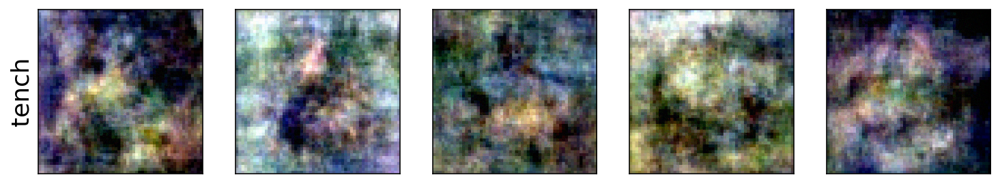

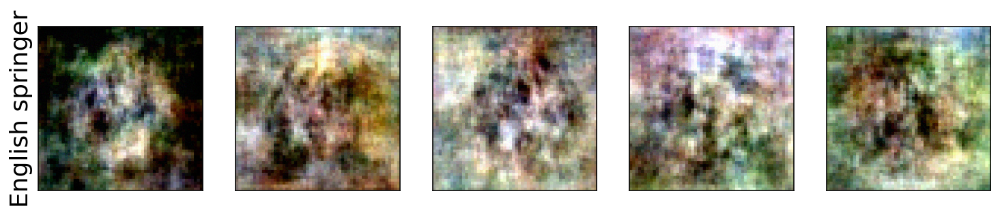

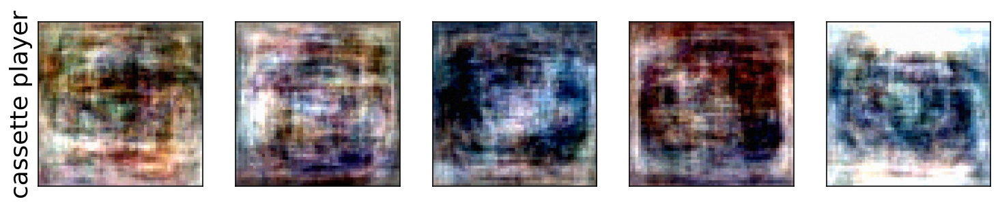

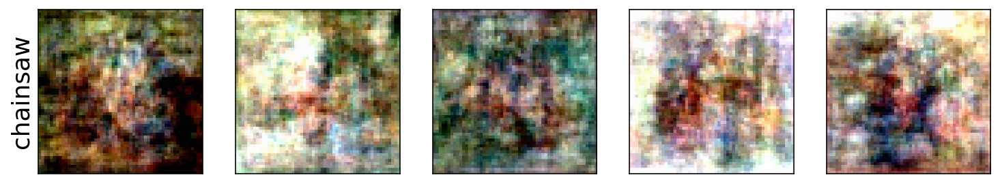

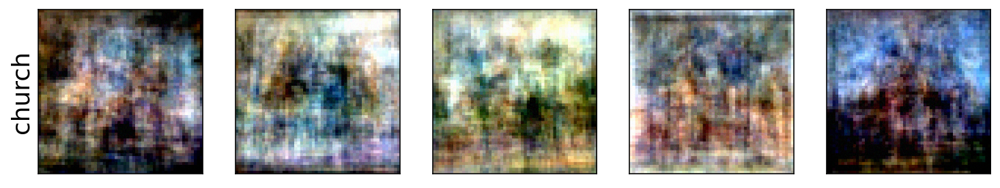

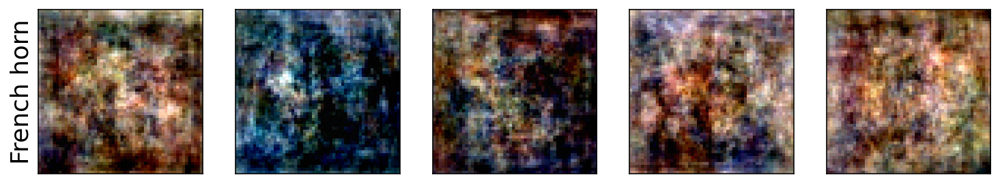

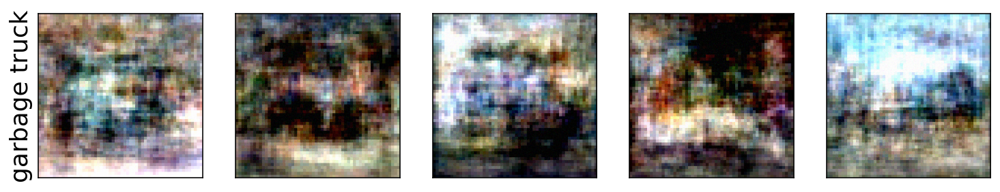

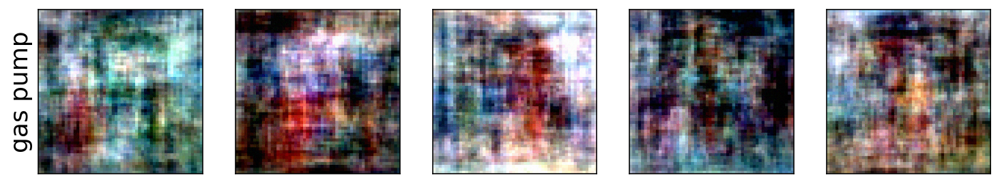

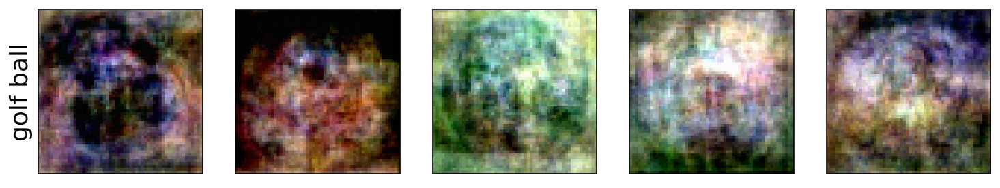

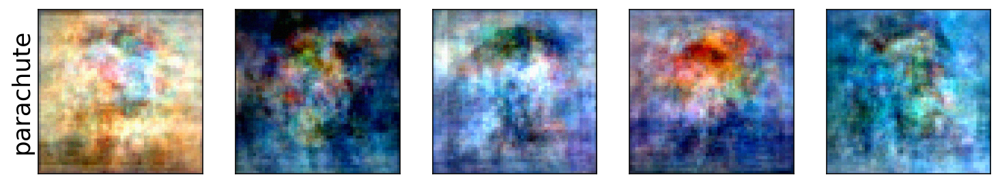

In [ ]:
for i in range(NUM_CLASSES_VIS):
    target_class = label_mapping[i] * ch.ones((BATCH_SIZE, )).to(device) 
    class_order = i * ch.ones((BATCH_SIZE, )).to(device)
    im_seed = ch.stack([conditionals[int(t)].sample().view(3, DATA_SHAPE//GRAIN, DATA_SHAPE//GRAIN) for t in class_order]).to(device)
    # im_seed = ch.stack([conditionals[int(t)].sample().view(3, DATA_SHAPE//GRAIN, DATA_SHAPE//GRAIN) 
    #                     for t in target_class]).to(device)
    
    im_seed = upsample(ch.clamp(im_seed, min=0, max=1)).to(device)
    im_gen = attacks_hw5.FGM_L2_attack(normalizedModel2, device, im_seed, target_class.long(), alpha=1, iters=60)
    #t = t+1
    if show_seed:
        show_image_row([im_seed.cpu()], [f'Seed ($x_0$)'], fontsize=18)
    show_image_row([im_gen.detach().cpu()], 
                   [CLASSES[int(t)].split(',')[0] for t in target_class], 
                   fontsize=18, filename=f"/content/robustness_applications/img_generation_pics_forreport/{CLASSES[int(target_class[0])].split(',')[0]}_nonrobust.png")